### Sample Code from SciPy

In [2]:
from scipy import signal
import numpy as np
from scipy.io import wavfile
fs, data = wavfile.read("9khz-tone.wav")
import matplotlib.pyplot as plt


In [2]:
sig = np.repeat([0., 1., 1., 0., 1., 0., 0., 1.], 128)
sig_noise = sig + np.random.randn(len(sig))
corr = signal.correlate(sig_noise, np.ones(128), mode='same') /128



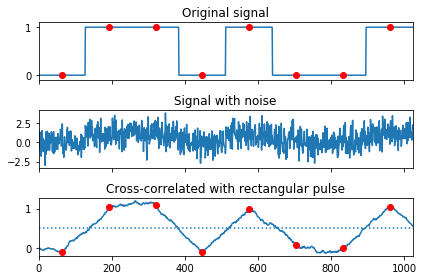

In [3]:
clock = np.arange(64, len(sig), 128)

fig, (ax_orig, ax_noise, ax_corr) = plt.subplots(3, 1, sharex=True)
ax_orig.plot(sig)
ax_orig.plot(clock, sig[clock], 'ro')
ax_orig.set_title('Original signal')
ax_noise.plot(sig_noise)
ax_noise.set_title('Signal with noise')
ax_corr.plot(corr)
ax_corr.plot(clock, corr[clock], 'ro')
ax_corr.axhline(0.5, ls=':')
ax_corr.set_title('Cross-correlated with rectangular pulse')
ax_orig.margins(0, 0.1)
fig.tight_layout()
fig.show()

### Testing 15kHz Signal and Outputs of Match Filters

In [4]:
data.shape

(182151,)

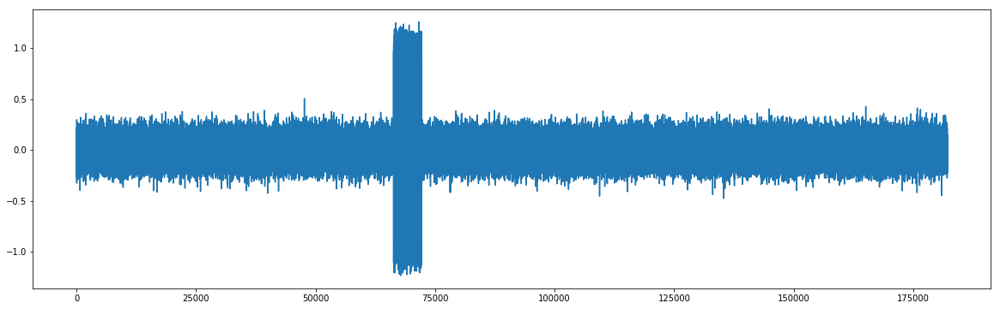

In [5]:
#Adding noise to the data signal
data_noise = data + (np.random.randn(len(data))/10)

#Extracting the signal from data for correlation
start = next((i for i, x in enumerate(data) if x), None)
end = len(data) - (next((i for i, x in enumerate(data[::-1]) if x), None))

#View data and correlation signal
plt.figure(figsize=(20,6))
plt.plot(data_noise)
plt.show()

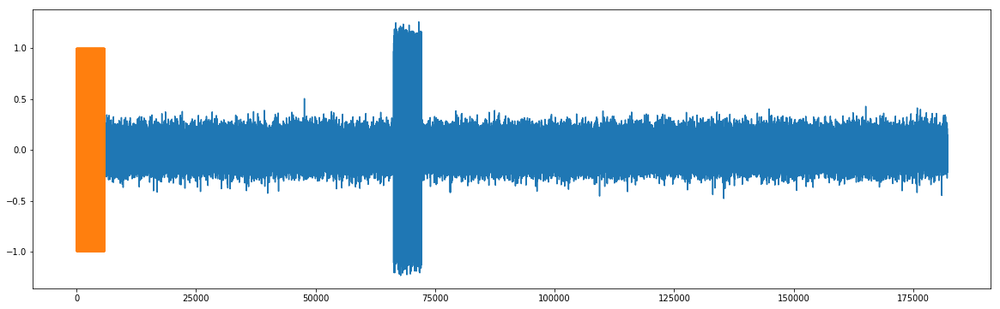

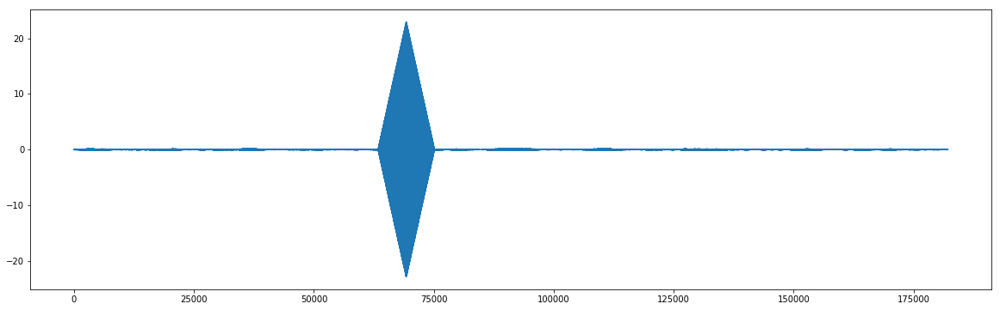

In [6]:
matchSignal = data[start:end]
corr = signal.correlate(data_noise, matchSignal, mode='same') / 128

plt.figure(figsize=(20,6))
plt.plot(data_noise)
plt.plot(matchSignal)
plt.show()

plt.figure(figsize=(20,6))
plt.plot(corr)
plt.show()

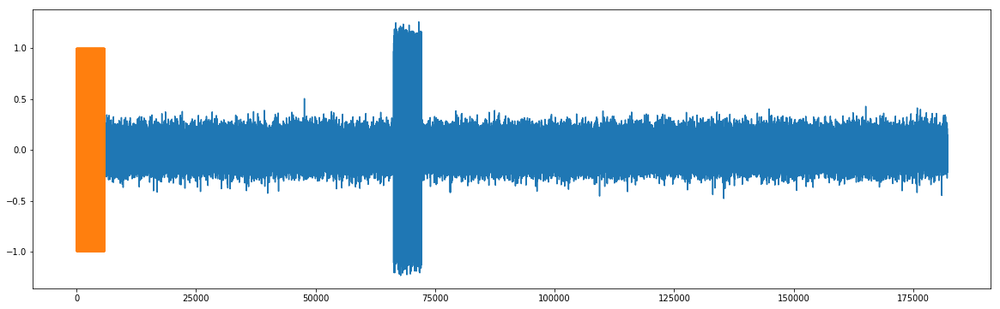

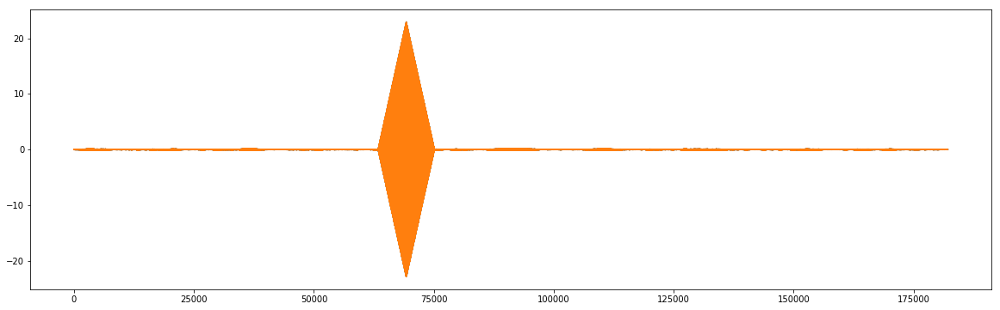

In [7]:
signal_shift = np.roll(matchSignal,2)
corr2 = signal.correlate(data_noise, signal_shift, mode='same') / 128

plt.figure(figsize=(20,6))
plt.plot(data_noise)
plt.plot(matchSignal)
plt.show()

plt.figure(figsize=(20,6))
plt.plot(corr)
plt.plot(corr2)
plt.show()

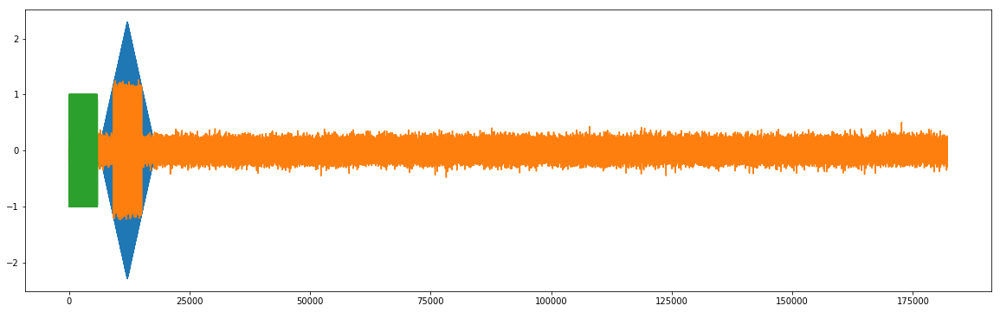

In [14]:
shift_value = 125000
messy_data = np.roll(data_noise,shift_value)
corr3 = signal.correlate(messy_data, matchSignal, mode='same') / 1280

plt.figure(figsize=(20,6))
plt.plot(corr3)
plt.plot(messy_data)
plt.plot(matchSignal)
plt.show()

# plt.figure(figsize=(20,6))
# plt.plot(corr3)
# plt.show()

Determine Whether the sample timings are correct or not

In [11]:
#actual_start = (start + shift_value) % 182151
actual_start = (start + shift_value) %  182151

maxPeak = np.argmax(corr3)
minPeak = np.argmin(corr3)

topDiff = abs(actual_start - (maxPeak - (len(matchSignal)/2)))
botDiff = abs(actual_start - (minPeak - (len(matchSignal)/2)))

print("Top Diff: " + topDiff.astype(str) + " Samples")
print("Bot Diff: " + botDiff.astype(str) + " Samples")

# signal_start = next((i for i, x in enumerate(data) if x), None)

Top Diff: 0.5 Samples
Bot Diff: 21.5 Samples


#### Match Filter to Determine Start of Signal
#### Using Donovan's Signal Simulator

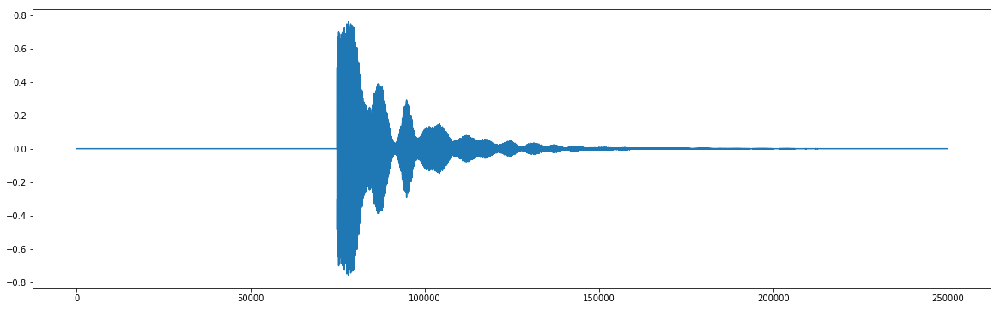

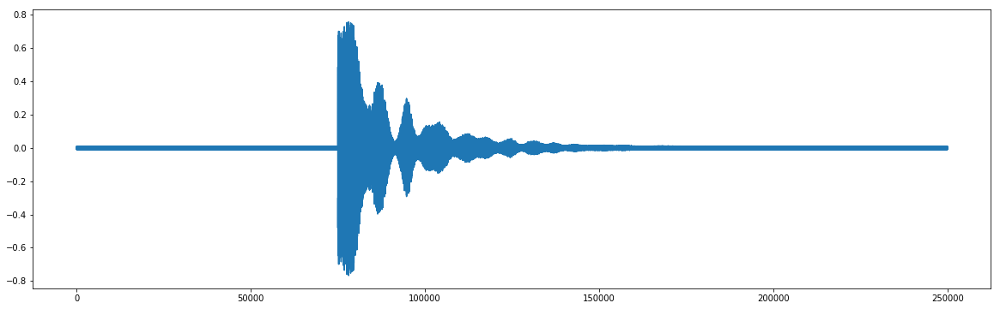

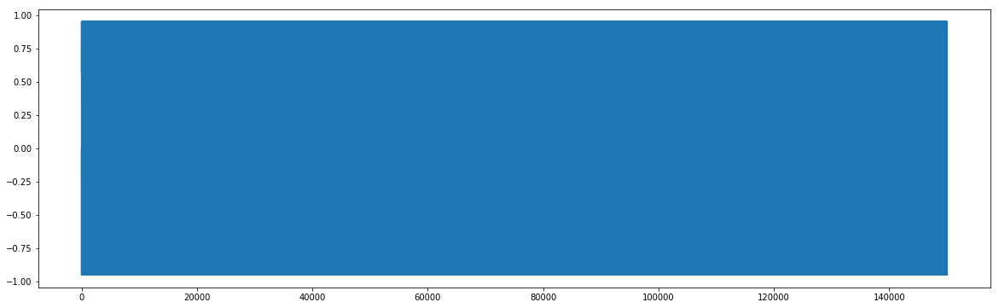

In [63]:
pureSignal = np.genfromtxt('pureSignal.csv', delimiter=',')
testSignal = np.genfromtxt('testSignal.csv', delimiter=',')

squareSignal = np.genfromtxt('25kHz.csv', delimiter=',')
# squareSignal = squareSignal[:50000]
# squareSignal = squareSignal[:25000] #get a trunucated version

#phase shifted slightly -> 3 = 7/2 sample error
#5 = 5/0
#13 = 7/2
#4 = 6/1
#seems like max error here is #of samples for half a wavelength -> could become 2-3 if we can better select than just "max"
squareSignal = squareSignal[4:25004] 

signalStart = next((i for i, x in enumerate(pureSignal) if x), None)

plt.figure(figsize=(20,6))
plt.plot(cleanSignal)
plt.show()

plt.figure(figsize=(20,6))
plt.plot(testSignal)
plt.show()

plt.figure(figsize=(20,6))
plt.plot(blocc)
plt.show()

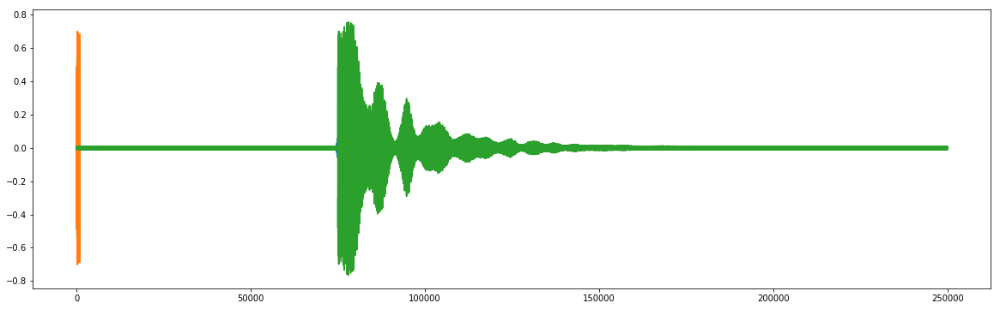

In [59]:
#This is assuming that we know the correct signal (including it's decay within the pool)
#After testing, this seems obvious -> even a match signal of 1000 samples gives 0 sample error -> very idealistic/not realistic situation

matchSignal = pureSignal[signalStart:signalStart+1000]

correlation = signal.correlate(testSignal, matchSignal, mode='same') / 1280

plt.figure(figsize=(20,6))
plt.plot(correlation)
plt.plot(matchSignal)
plt.plot(testSignal)
plt.show()

In [60]:
#Calculation to see sample error
actual_start = signalStart

maxPeak = np.argmax(correlation)
minPeak = np.argmin(correlation)

topDiff = abs(actual_start - (maxPeak - (len(matchSignal)/2)))
botDiff = abs(actual_start - (minPeak - (len(matchSignal)/2)))

print("Top Diff: " + topDiff.astype(str) + " Samples")
print("Bot Diff: " + botDiff.astype(str) + " Samples")

Top Diff: 2910.0 Samples
Bot Diff: 2915.0 Samples


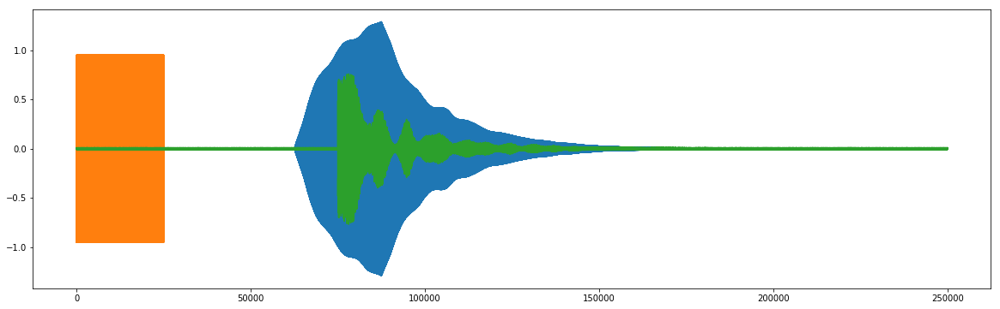

In [64]:
#This is assuming that we know nothing, only frequency
#After testing, this seems less obvious..? a correlation with only frequency gives PERFECT results -> not sure whether noise would affect this or not
#and not sure whether this is simply "it"

#After some thought, it's because the leading edge is the loudest which causes the shape
#not sure if any situation could actually cause this method to fail (minus figuring out what's better than just "max")

#When we include the entire length of the match signal, we get:
# Top Diff: 2820.0 Samples
# Bot Diff: 2915.0 Samples
#Most likely because we're including the exponential decay at the end

matchSignal = squareSignal

correlation = signal.correlate(testSignal, matchSignal, mode='same') / 2560

plt.figure(figsize=(20,6))
plt.plot(correlation)
plt.plot(matchSignal)
plt.plot(testSignal)
plt.show()

In [65]:
#Calculation to see sample error
actual_start = signalStart

maxPeak = np.argmax(correlation)
minPeak = np.argmin(correlation)

topDiff = actual_start - (maxPeak - (len(matchSignal)/2))
botDiff = actual_start - (minPeak - (len(matchSignal)/2))

print("Top Diff: " + topDiff.astype(str) + " Samples")
print("Bot Diff: " + botDiff.astype(str) + " Samples")

Top Diff: 6.0 Samples
Bot Diff: 1.0 Samples
